In [1]:
import pandas as pd
import pymongo
from pymongo import MongoClient
from pandas.io.json import json_normalize
import math
from numpy import nan
import numpy as np

In [2]:
from sshtunnel import SSHTunnelForwarder

server = SSHTunnelForwarder(
    '128.226.28.123',
    ssh_username="ibagchi1",
    ssh_password="PLchqIz49",
    remote_bind_address=('127.0.0.1', 27017)
)

server.start()

print(server.local_bind_port)  # show assigned local port
# work with `SECRET SERVICE` through `server.local_bind_port`.

#server.stop()

55601


In [3]:
client=pymongo.MongoClient('127.0.0.1',server.local_bind_port)
mydb=client['SMDP']
reddit_collection=mydb['reddit']

### Creating a dataframe from the pickle file named df_reddit

In [4]:
#Converting to Pickle File 
datapoints = list(reddit_collection.find({}))
dataframe = json_normalize(datapoints)
dataframe.to_pickle("reddit_data.pkl")
#Creating dataframe from pickle file
df_reddit=pd.read_pickle("reddit_data.pkl")
df_reddit.head()
df=df_reddit

In [5]:
df

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
0,6361b07a11d8208044573dd6,t3,yfqh0q,t5_2qh6e,television,Comments are sorted by new by default.\n\n* Fe...,t2_6l4z3,What are you watching and what do you recommen...,r/television,0.89,self.television,2022-11-01 23:49:14.324
1,6361b07a11d8208044573dd7,t3,yjdk99,t5_2qh6e,television,,t2_aldnblqh,Ryan Murphy Reveals That Some Fox Execs Called...,r/television,0.89,pride.com,2022-11-01 23:49:14.324
2,6361b07a11d8208044573dd8,t3,yj6q8q,t5_2qh6e,television,,t2_cw2ly,James Corden repeats a joke originally made by...,r/television,0.88,youtu.be,2022-11-01 23:49:14.324
3,6361b07a11d8208044573dd9,t3,yj6paw,t5_2qh6e,television,,t2_5adwlxvn,‘The Last of Us’ HBO Series Release Date Revea...,r/television,0.96,bloody-disgusting.com,2022-11-01 23:49:14.324
4,6361b07a11d8208044573dda,t3,yjbday,t5_2qh6e,television,,t2_5adwlxvn,‘Fate: The Winx Saga’ Cancelled at Netflix Aft...,r/television,0.94,tvline.com,2022-11-01 23:49:14.324
...,...,...,...,...,...,...,...,...,...,...,...,...
1213,63849bc5b3f5bca534a6e695,t3,z6ciav,t5_2rgm3,30ROCK,,t2_dudzq,What favorite little details have you caught? ...,r/30ROCK,0.98,youtu.be,2022-11-28 11:30:13.245
1214,63849bc5b3f5bca534a6e696,t3,z66g55,t5_2rgm3,30ROCK,30 rock is one of my favs but haven’t watched ...,t2_7wq53q0r,It’s shocking how straight laced the first sea...,r/30ROCK,0.96,self.30ROCK,2022-11-28 11:30:13.245
1215,63849bc5b3f5bca534a6e697,t3,z6lopi,t5_2rgm3,30ROCK,,t2_615nw,"Dude, that’s Margaret Cho!",r/30ROCK,1.00,youtu.be,2022-11-28 11:30:13.245
1216,6384d5d9b3f5bca534a6e944,t3,z6u0ka,t5_2cneq,politics,,t2_br3zk9t1,FBI and DHS failing to address threat of domes...,r/politics,0.98,salon.com,2022-11-28 15:38:01.062


### Descyptive Analysis

### 1. Maximum upvote ratio for our dataset

In [6]:
#Max Upvote Ratio
#For checking maximum seasons in a show
max_upvote_info = df.loc[df['upvote_ratio'].idxmax()]
max_upvote = df.max()['upvote_ratio']
print(max_upvote_info)
print(max_upvote)

_id                                                 6361b07b11d8208044573e0c
kind                                                                      t3
id                                                                    x0zizq
subreddit_id                                                        t5_2u05j
subreddit                                                     betterCallSaul
text                       Here are the results of the Season 6 Survey an...
author_fullname                                                     t2_8xv17
title                             /r/BetterCallSaul Season 6 Survey Results!
subreddit_name_prefixed                                     r/betterCallSaul
upvote_ratio                                                             1.0
domain                                                   self.betterCallSaul
created_date                                      2022-11-01 23:49:15.540000
Name: 54, dtype: object
1.0


### 2. Minimum upvote ratio for our dataset

In [7]:
#Min Upvote Ratio
min_upvote_info = df.loc[df['upvote_ratio'].idxmax()]
min_upvote = df.min()['upvote_ratio']
print(min_upvote)
print(min_upvote_info)

0.2
_id                                                 6361b07b11d8208044573e0c
kind                                                                      t3
id                                                                    x0zizq
subreddit_id                                                        t5_2u05j
subreddit                                                     betterCallSaul
text                       Here are the results of the Season 6 Survey an...
author_fullname                                                     t2_8xv17
title                             /r/BetterCallSaul Season 6 Survey Results!
subreddit_name_prefixed                                     r/betterCallSaul
upvote_ratio                                                             1.0
domain                                                   self.betterCallSaul
created_date                                      2022-11-01 23:49:15.540000
Name: 54, dtype: object


### 3.Counting the number of tv shows with max upvote ratio

In [8]:
#checking the number of tv shows with max upvote ratio
print(len(df[df.upvote_ratio ==1.0]))
df.loc[df['upvote_ratio'] == 1.0]


81


,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
54,6361b07b11d8208044573e0c,t3,x0zizq,t5_2u05j,betterCallSaul,Here are the results of the Season 6 Survey an...,t2_8xv17,/r/BetterCallSaul Season 6 Survey Results!,r/betterCallSaul,1.0,self.betterCallSaul,2022-11-01 23:49:15.540
69,6361b07b11d8208044573e1b,t3,yjozws,t5_2u05j,betterCallSaul,,t2_my07kdt9,Went as the world's 2nd best lawyer (but best ...,r/betterCallSaul,1.0,reddit.com,2022-11-01 23:49:15.540
113,6361b07c11d8208044573e47,t3,yjjps9,t5_2rjz2,gameofthrones,,t2_mccoravz,What other tv shows/movies have you seen GoT a...,r/gameofthrones,1.0,i.redd.it,2022-11-01 23:49:16.783
116,6361b07c11d8208044573e4a,t3,yjlc4o,t5_2rjz2,gameofthrones,,t2_1ae1876p,THE PINK DREAD IS COMING!,r/gameofthrones,1.0,i.redd.it,2022-11-01 23:49:16.783
127,6361b07c11d8208044573e55,t3,yjotvh,t5_2rjz2,gameofthrones,,t2_nkydr,Since there is been match ups lately what abou...,r/gameofthrones,1.0,i.redd.it,2022-11-01 23:49:16.783
...,...,...,...,...,...,...,...,...,...,...,...,...
1147,63834a40b3f5bca534a6dea3,t3,z5um8o,t5_2r4zz,BigBrother,I watched 1-20 as a kid and teenager and there...,t2_pvqkr,My favorite player after rewatching season 2 a...,r/BigBrother,1.0,self.BigBrother,2022-11-27 11:30:08.984
1196,63849bbcb3f5bca534a6e516,t3,z6sp2f,t5_2rjz2,gameofthrones,,t2_juviusic,An order that changes the entire Westeros,r/gameofthrones,1.0,i.redd.it,2022-11-28 11:30:04.397
1198,63849bc1b3f5bca534a6e5f5,t3,z6ooz3,t5_2r4zz,BigBrother,I was a kid watching the show live and Kaysar ...,t2_pvqkr,The most awesome BB gameplay moment I have seen!,r/BigBrother,1.0,self.BigBrother,2022-11-28 11:30:09.626
1215,63849bc5b3f5bca534a6e697,t3,z6lopi,t5_2rgm3,30ROCK,,t2_615nw,"Dude, that’s Margaret Cho!",r/30ROCK,1.0,youtu.be,2022-11-28 11:30:13.245


### 4.Counting the number of tv shows with min upvote ratio

In [9]:
#checking the number of tv shows with min upvote ratio
len(df[df.upvote_ratio ==0.2])
df.loc[df['upvote_ratio'] == 0.2]

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
393,6361b08411d8208044573f7a,t3,yjkl90,t5_2tqcj,howyoudoin,,t2_tvxfteea,Even Phoebe could make a better song than this,r/howyoudoin,0.2,youtu.be,2022-11-01 23:49:24.008


In [10]:
print(len(df[df.subreddit_name_prefixed =='r/television']))
len(df.loc[df['subreddit_name_prefixed'] == 'r/television'])

104


104

### 5.Count of unique domains in our dataset: 24

In [11]:
#Count of unique domains is 24 and the list
domain_list=[]
for r in range(0,78):
    dom=df['domain'][r]
    if dom not in domain_list:
        domain_list.append(dom)
print(len(domain_list))
print(domain_list)

24
['self.television', 'pride.com', 'youtu.be', 'bloody-disgusting.com', 'tvline.com', 'deadline.com', 'pajiba.com', 'variety.com', 'youtube.com', 'insider.com', 'nerdist.com', 'looper.com', 'indiewire.com', 'pastemagazine.com', 'washingtonpost.com', 'self.marvelstudios', 'i.redd.it', 'reddit.com', 'thedirect.com', 'v.redd.it', 'boxofficepro.com', 'slashfilm.com', 'self.betterCallSaul', 'i.imgur.com']


In [12]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /Users/macbook/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/macbook/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

### 6. Wordcount for each reddit post

In [13]:
#Fetch wordcount for each abstract
df['word_count'] = df['title'].apply(lambda x: len(str(x).split(" ")))
df[['title','word_count']].head()

,title,word_count
0,What are you watching and what do you recommen...,14
1,Ryan Murphy Reveals That Some Fox Execs Called...,12
2,James Corden repeats a joke originally made by...,13
3,‘The Last of Us’ HBO Series Release Date Revea...,13
4,‘Fate: The Winx Saga’ Cancelled at Netflix Aft...,10


### 7.Descriptive statistics of word counts

In [14]:
##Descriptive statistics of word counts
df.word_count.describe()

count    1218.000000
mean       11.613300
std         8.191267
min         1.000000
25%         6.000000
50%        10.000000
75%        14.000000
max        54.000000
Name: word_count, dtype: float64

### 8. Identifying common words

In [15]:
#Identify common words
import pandas as pd
freq = pd.Series(' '.join(df['title']).split()).value_counts()[:20]
freq

the     472
to      279
of      252
a       231
in      226
and     202
I       142
is      131
for     119
The     105
on      102
you      88
was      86
this     78
that     63
as       61
at       60
-        56
with     56
my       55
dtype: int64

### 9. Identifying uncommon words

In [16]:
#Identify uncommon words
uncommon_freq =  pd.Series(' '.join(df['title']).split()).value_counts()[-20:]
uncommon_freq

e14             1
(the            1
box)            1
Rigby’s         1
Regular         1
counterparts    1
miss?           1
Squashes        1
Unhinged        1
Lunatic         1
x               1
Magic           1
Jacket          1
2007.           1
stopping        1
guy?            1
"It             1
found.          1
child           1
48              1
dtype: int64

### 10. Importing the libraries for text preprocessing

In [17]:
# Libraries for text preprocessing
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
nltk.download('wordnet') 
from nltk.stem.wordnet import WordNetLemmatizer

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/macbook/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/macbook/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/macbook/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/macbook/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


### 11. Creating a list of custom stopwords

In [18]:
##Creating a list of stop words and adding custom stopwords
stop_words = set(stopwords.words("english"))
##Creating a list of custom stopwords
new_words = ["using","also","thing","said","could","anyone","hub","last","season","discussion","volume","st","kid","series","still","poster","spoiler","want","year","episode","get"]
stop_words = stop_words.union(new_words)

### 12. Function for making wordcloud out od corpus of reddit post provided

In [21]:
#Word cloud
def wordcloud(corpus):
    from os import path
    from PIL import Image
    from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
    import matplotlib.pyplot as plt
    #% matplotlib inline
    wordcloud = WordCloud(
                              background_color='white',
                              stopwords=stop_words,
                              max_words=100,
                              max_font_size=50, 
                              random_state=42
                             ).generate(str(corpus))
    print(wordcloud)
    fig = plt.figure(1)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
    fig.savefig("word1.png", dpi=900)

### For each subreddit, extracting popular phrases of (2,4) gram words and picking the top 30
##### Creating a bar graph at the end

******For Subreddit  StrangerThings *******8


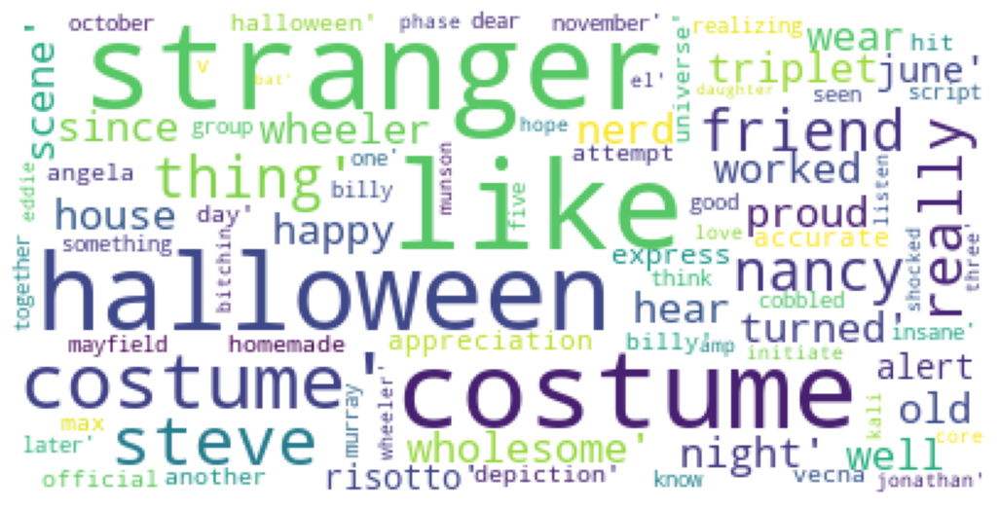

                            Tri-gram  Freq
0                     stranger thing     5
1                      nancy wheeler     2
2                      steve costume     1
3                       costume wear     1
4                         wear proud     1
5                         proud well     1
6                        well turned     1
7                 steve costume wear     1
8                 costume wear proud     1
9                    wear proud well     1
10                 proud well turned     1
11          steve costume wear proud     1
12           costume wear proud well     1
13            wear proud well turned     1
14                       old triplet     1
15                  triplet stranger     1
16                   thing halloween     1
17                 halloween costume     1
18              old triplet stranger     1
19            triplet stranger thing     1
20          stranger thing halloween     1
21           thing halloween costume     1
22        o

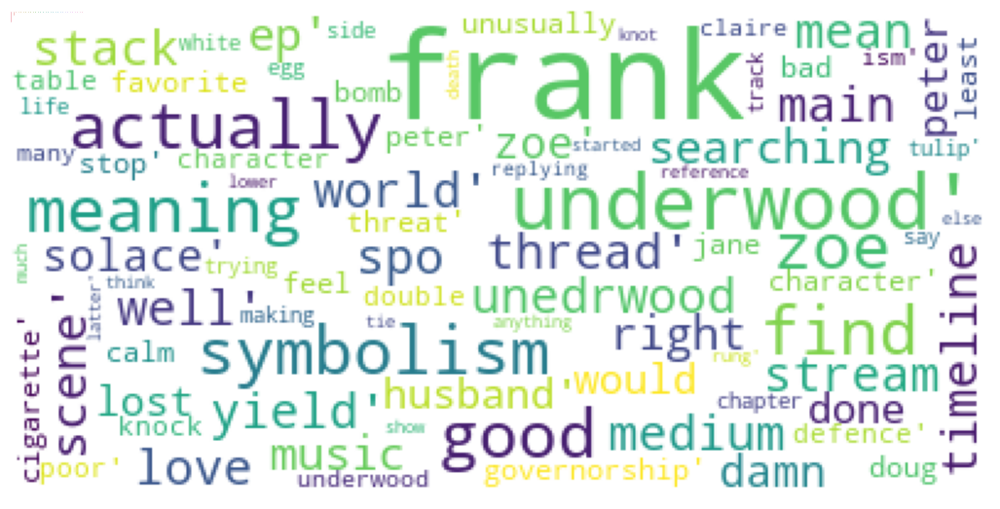

                          Tri-gram  Freq
0                  frank underwood     3
1                       frank good     2
2                      main stream     1
3                    stream medium     1
4                     medium scene     1
5               main stream medium     1
6              stream medium scene     1
7         main stream medium scene     1
8                       frank mean     1
9                       mean stack     1
10                       stack spo     1
11                        spo well     1
12                frank mean stack     1
13                  mean stack spo     1
14                  stack spo well     1
15            frank mean stack spo     1
16             mean stack spo well     1
17                      love frank     1
18            love frank underwood     1
19                  timeline frank     1
20                 frank unedrwood     1
21                 unedrwood world     1
22        timeline frank unedrwood     1
23           fra

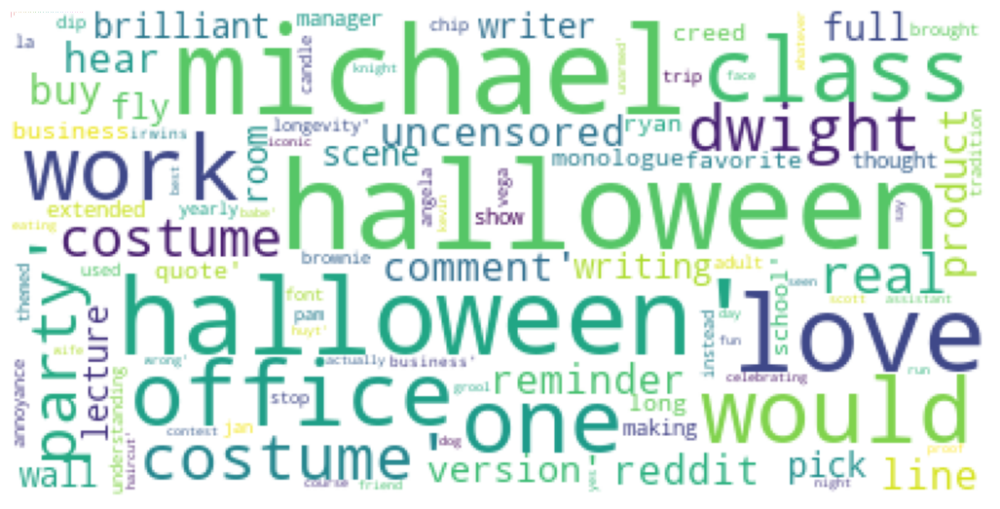

2022-11-28 21:20:51,723| ERROR   | Could not establish connection from local ('127.0.0.1', 55601) to remote ('127.0.0.1', 27017) side of the tunnel: open new channel ssh error: Timeout opening channel.
2022-11-28 21:20:52,960| ERROR   | Could not establish connection from local ('127.0.0.1', 55601) to remote ('127.0.0.1', 27017) side of the tunnel: open new channel ssh error: Timeout opening channel.


                        Tri-gram  Freq
0                halloween party     2
1                  michael scott     2
2                   reminder buy     1
3                    buy product     1
4                 product reddit     1
5                 reddit comment     1
6           reminder buy product     1
7             buy product reddit     1
8         product reddit comment     1
9    reminder buy product reddit     1
10    buy product reddit comment     1
11                     line hear     1
12               hear uncensored     1
13            uncensored version     1
14          line hear uncensored     1
15       hear uncensored version     1
16  line hear uncensored version     1
17                   office full     1
18                full brilliant     1
19             brilliant writing     1
20                  writing pick     1
21                      pick one     1
22                     one scene     1
23                     scene fly     1
24                      f

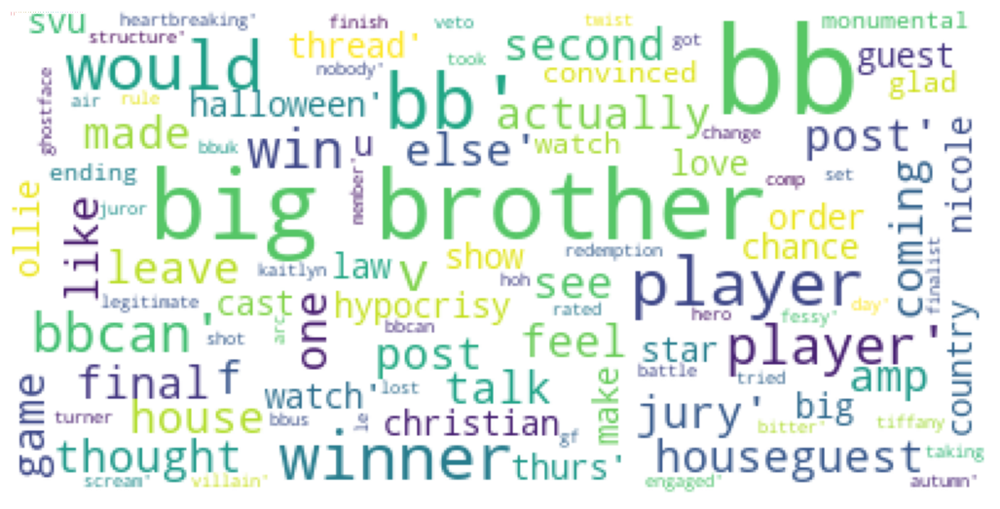

                    Tri-gram  Freq
0                big brother    13
1                    bb post     2
2                post thread     1
3             bb post thread     1
4               bb christian     1
5            christian guest     1
6                 guest star     1
7                   star law     1
8                    law amp     1
9                  amp order     1
10                 order svu     1
11                 svu thurs     1
12        bb christian guest     1
13      christian guest star     1
14            guest star law     1
15              star law amp     1
16             law amp order     1
17             amp order svu     1
18           order svu thurs     1
19   bb christian guest star     1
20  christian guest star law     1
21        guest star law amp     1
22        star law amp order     1
23         law amp order svu     1
24       amp order svu thurs     1
25         brother halloween     1
26     big brother halloween     1
27           ollie h

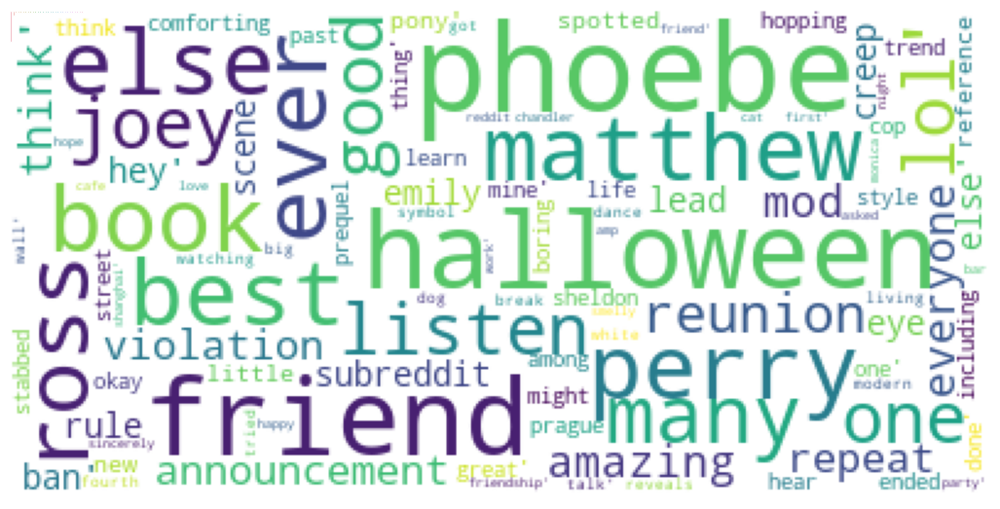

                                   Tri-gram  Freq
0                             matthew perry     2
1                           reunion amazing     1
2                          amazing everyone     1
3                             everyone else     1
4                                else think     1
5                  reunion amazing everyone     1
6                     amazing everyone else     1
7                       everyone else think     1
8             reunion amazing everyone else     1
9               amazing everyone else think     1
10                         mod announcement     1
11                      announcement repeat     1
12                         repeat violation     1
13                      violation subreddit     1
14                           subreddit rule     1
15                                rule lead     1
16                                 lead ban     1
17                  mod announcement repeat     1
18            announcement repeat violation     1


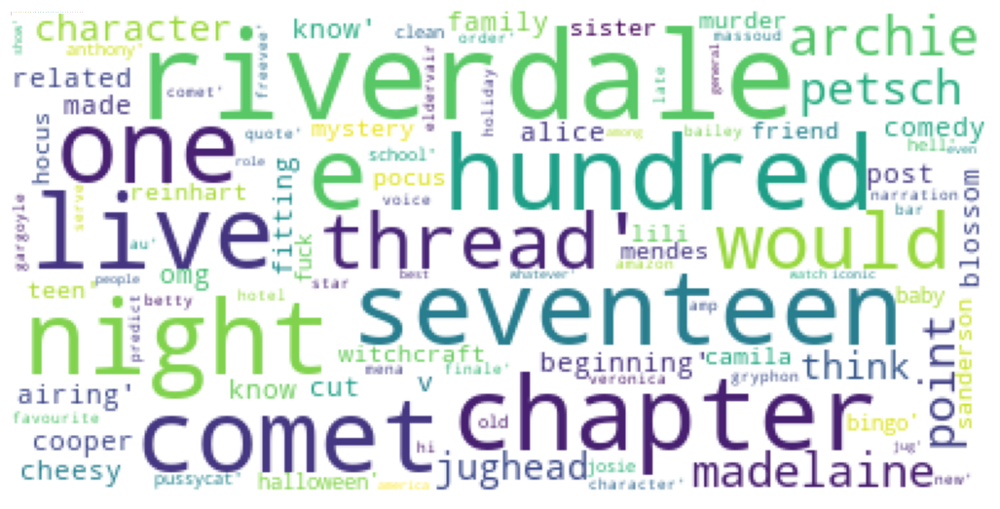

                         Tri-gram  Freq
0                     chapter one     2
1                     one hundred     2
2               hundred seventeen     2
3                 seventeen night     2
4                     night comet     2
5             chapter one hundred     2
6           one hundred seventeen     2
7         hundred seventeen night     2
8           seventeen night comet     2
9   chapter one hundred seventeen     2
10    one hundred seventeen night     2
11  hundred seventeen night comet     2
12               madelaine petsch     2
13                     comet live     1
14                    live thread     1
15               night comet live     1
16              comet live thread     1
17     seventeen night comet live     1
18        night comet live thread     1
19                     comet post     1
20                    post thread     1
21               night comet post     1
22              comet post thread     1
23     seventeen night comet post     1


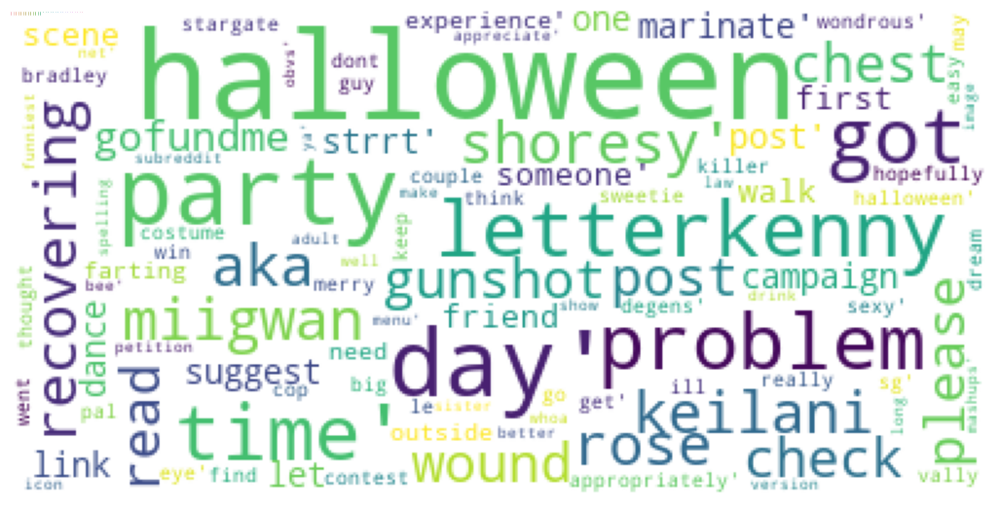

                      Tri-gram  Freq
0              halloween party     3
1                  got problem     2
2                 keilani rose     1
3                     rose aka     1
4                  aka miigwan     1
5           miigwan recovering     1
6           recovering gunshot     1
7                gunshot wound     1
8                  wound chest     1
9                 chest please     1
10                 please read     1
11                   read post     1
12                  post check     1
13              check gofundme     1
14           gofundme campaign     1
15               campaign link     1
16                   link post     1
17            keilani rose aka     1
18            rose aka miigwan     1
19      aka miigwan recovering     1
20  miigwan recovering gunshot     1
21    recovering gunshot wound     1
22         gunshot wound chest     1
23          wound chest please     1
24           chest please read     1
25            please read post     1
2

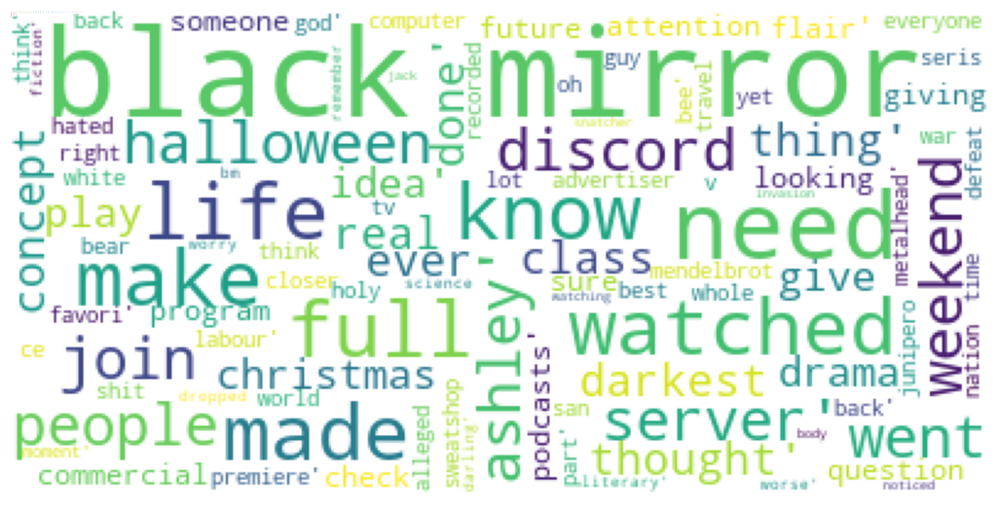

                         Tri-gram  Freq
0                    black mirror     6
1                    mirror thing     2
2              black mirror thing     2
3                      join black     1
4                  mirror discord     1
5                  discord server     1
6               join black mirror     1
7            black mirror discord     1
8           mirror discord server     1
9       join black mirror discord     1
10    black mirror discord server     1
11              halloween weekend     1
12                   weekend went     1
13                    went ashley     1
14         halloween weekend went     1
15            weekend went ashley     1
16  halloween weekend went ashley     1
17                    people know     1
18                   know thought     1
19            people know thought     1
20                      real life     1
21                     life black     1
22                     thing need     1
23                     need black     1


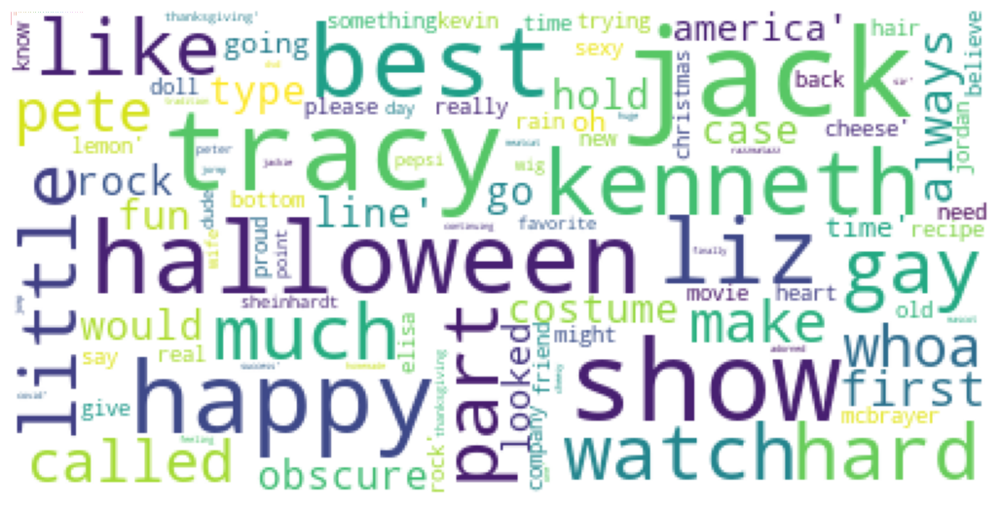

                     Tri-gram  Freq
0                   best line     3
1                   sexy baby     2
2               jack mcbrayer     2
3                  hard watch     2
4                tracy jordan     2
5               kevin grisham     2
6                 heart proud     2
7                   whoa whoa     2
8              sheinhardt wig     2
9                 wig company     2
10     sheinhardt wig company     2
11            peter principle     2
12                  liz lemon     2
13                 always one     1
14              first obscure     1
15          obscure halloween     1
16          halloween costume     1
17            costume adorned     1
18           adorned homemade     1
19               homemade dvd     1
20                   dvd case     1
21                case jackie     1
22               jackie jormp     1
23                 jormp jomp     1
24                  jomp huge     1
25               huge success     1
26    first obscure hallowee

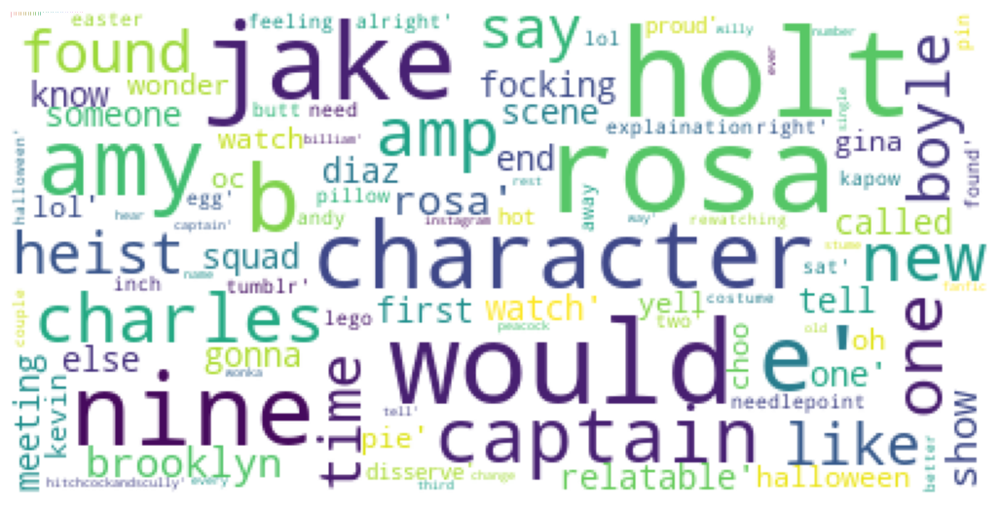

2022-11-28 21:21:12,101| ERROR   | Could not establish connection from local ('127.0.0.1', 55601) to remote ('127.0.0.1', 27017) side of the tunnel: open new channel ssh error: Timeout opening channel.
2022-11-28 21:21:13,133| ERROR   | Could not establish connection from local ('127.0.0.1', 55601) to remote ('127.0.0.1', 27017) side of the tunnel: open new channel ssh error: Timeout opening channel.


                        Tri-gram  Freq
0                   captain holt     4
1                  brooklyn nine     3
2                      nine nine     3
3             brooklyn nine nine     3
4                       jake amy     2
5                    called rosa     2
6                    charles amp     2
7                       amp rosa     2
8               charles amp rosa     2
9                    hot focking     1
10              focking disserve     1
11          hot focking disserve     1
12                     holt diaz     1
13                    diaz would     1
14                   would proud     1
15               holt diaz would     1
16              diaz would proud     1
17         holt diaz would proud     1
18             gonna needlepoint     1
19            needlepoint pillow     1
20                    pillow say     1
21                     say kapow     1
22      gonna needlepoint pillow     1
23        needlepoint pillow say     1
24              pillow sa

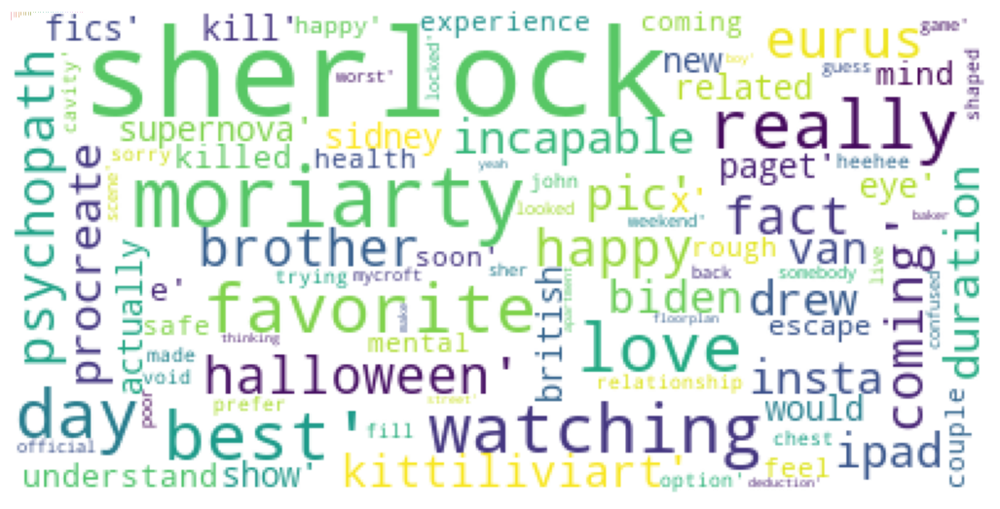

                                 Tri-gram  Freq
0                       watching sherlock     2
1                             fact coming     1
2                         happy halloween     1
3                            eurus really     1
4                             really love     1
5                            love brother     1
6                        brother sherlock     1
7                     sherlock psychopath     1
8                    psychopath incapable     1
9                          incapable love     1
10                               love pic     1
11                      eurus really love     1
12                    really love brother     1
13                  love brother sherlock     1
14            brother sherlock psychopath     1
15          sherlock psychopath incapable     1
16              psychopath incapable love     1
17                     incapable love pic     1
18              eurus really love brother     1
19           really love brother sherloc

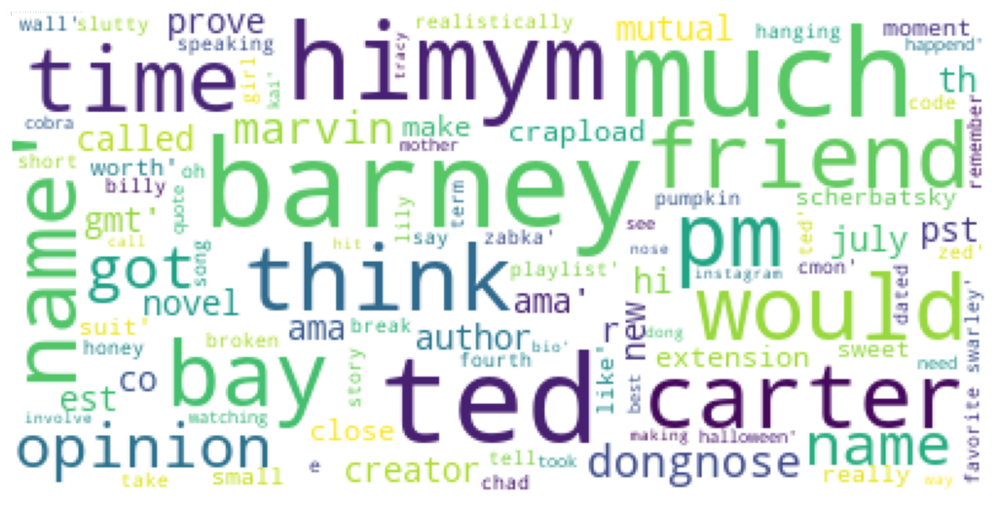

                 Tri-gram  Freq
0              carter bay     2
1              ama carter     1
2               bay himym     1
3              himym july     1
4                 july th     1
5                  th pst     1
6                  pst pm     1
7                  pm est     1
8                  est pm     1
9                  pm gmt     1
10         ama carter bay     1
11       carter bay himym     1
12         bay himym july     1
13          himym july th     1
14            july th pst     1
15              th pst pm     1
16             pst pm est     1
17              pm est pm     1
18             est pm gmt     1
19   ama carter bay himym     1
20  carter bay himym july     1
21      bay himym july th     1
22      himym july th pst     1
23         july th pst pm     1
24          th pst pm est     1
25          pst pm est pm     1
26          pm est pm gmt     1
27              hi carter     1
28                 bay co     1
29             co creator     1
########

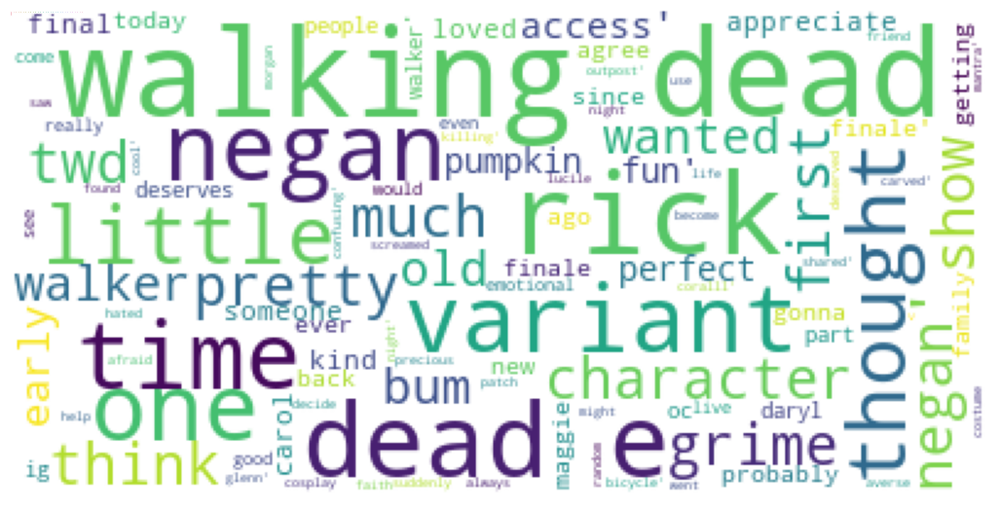

                      Tri-gram  Freq
0                 walking dead     7
1               variant walker     4
2                   rick grime     3
3                   dead faith     2
4                 early access     2
5           walking dead faith     2
6                   first time     2
7                     year ago     2
8                    ago today     2
9               year ago today     2
10                       oc ig     2
11               ig akithefull     2
12            oc ig akithefull     2
13                     bum bum     2
14                 faith early     1
15            dead faith early     1
16          faith early access     1
17    walking dead faith early     1
18     dead faith early access     1
19                dead outpost     1
20        walking dead outpost     1
21               pumpkin patch     1
22                 patch night     1
23                night carved     1
24         pumpkin patch night     1
25          patch night carved     1
2

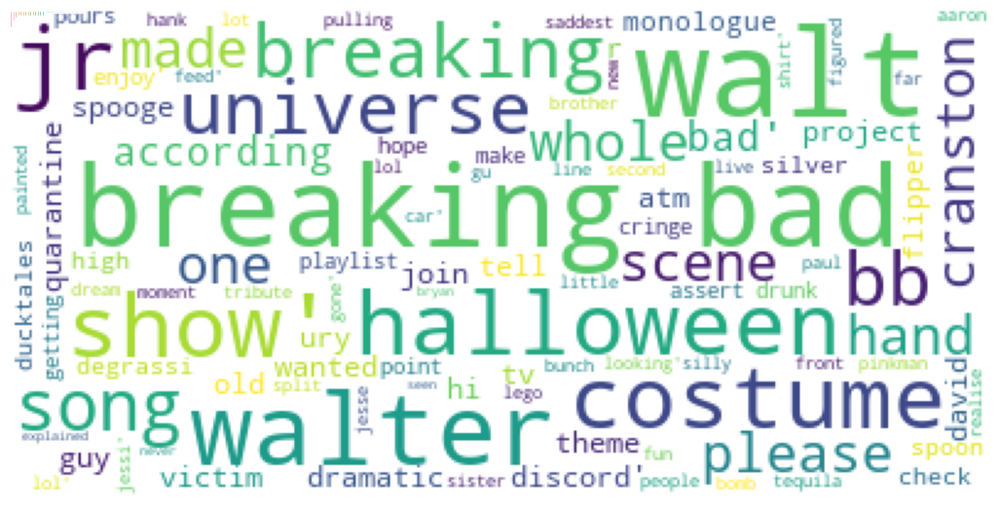

                         Tri-gram  Freq
0                    breaking bad     7
1                         walt jr     2
2                  walt according     2
3                   join breaking     1
4                    bad universe     1
5                universe discord     1
6               join breaking bad     1
7           breaking bad universe     1
8            bad universe discord     1
9      join breaking bad universe     1
10  breaking bad universe discord     1
11                          hi bb     1
12                      bb spooge     1
13                   spooge david     1
14                      david ury     1
15                        ury atm     1
16                     atm victim     1
17                  victim wanted     1
18                    wanted tell     1
19                       tell guy     1
20                 guy quarantine     1
21             quarantine project     1
22                    project old     1
23                         old tv     1


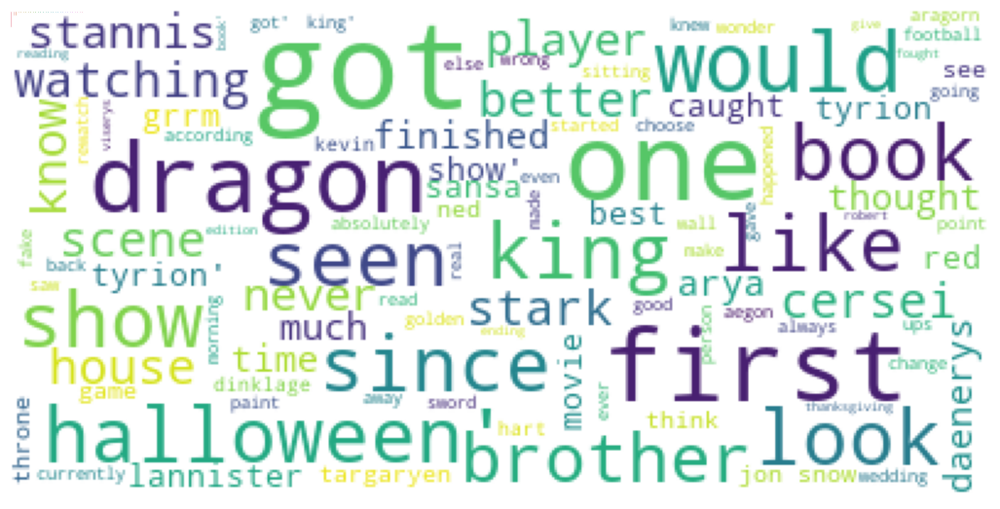

                   Tri-gram  Freq
0                first time     4
1                  jon snow     3
2              house dragon     3
3              watching got     3
4               game throne     3
5                kevin hart     2
6               hart tyrion     2
7         kevin hart tyrion     2
8                 look like     2
9           football player     2
10                book show     2
11               never seen     2
12              player game     2
13             finished got     2
14              red wedding     2
15               arya stark     2
16         lucerys velaryon     1
17         brother watching     1
18            watching rain     1
19           rain castamere     1
20          castamere later     1
21              later today     1
22           today prepared     1
23            prepared robb     1
24                 robb one     1
25                  one fav     1
26            fav character     1
27            character far     1
28    brother 

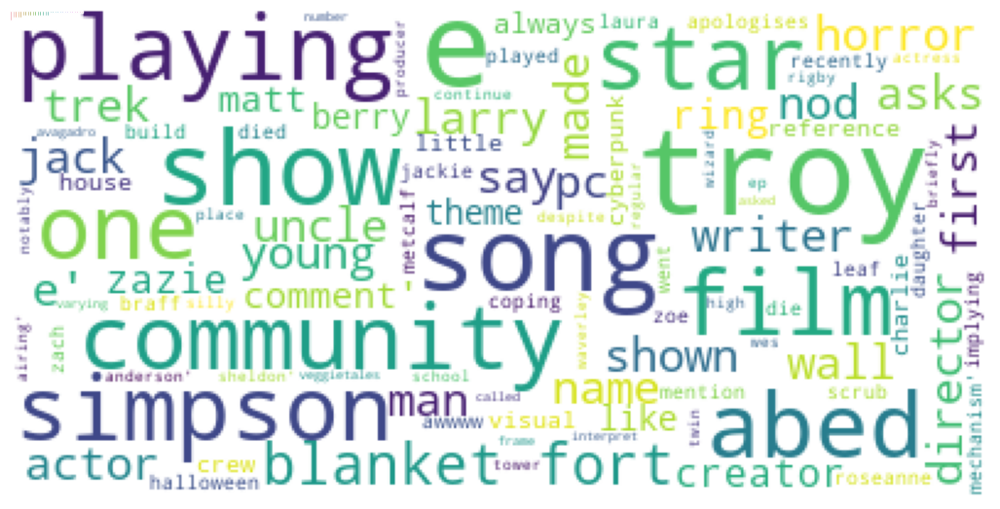

                  Tri-gram  Freq
0             blanket fort     3
1                 troy say     2
2                abed troy     2
3          writer director     2
4                star trek     2
5              zazie beetz     2
6               matt berry     2
7           community abed     1
8             abed mention     1
9             mention zach     1
10              zach braff     1
11             braff first     1
12           first episode     1
13           episode scrub     1
14              scrub troy     1
15         troy apologises     1
16         apologises troy     1
17               troy leaf     1
18          leaf community     1
19  community abed mention     1
20       abed mention zach     1
21      mention zach braff     1
22        zach braff first     1
23     braff first episode     1
24     first episode scrub     1
25      episode scrub troy     1
26   scrub troy apologises     1
27    troy apologises troy     1
28    apologises troy leaf     1
29     tro

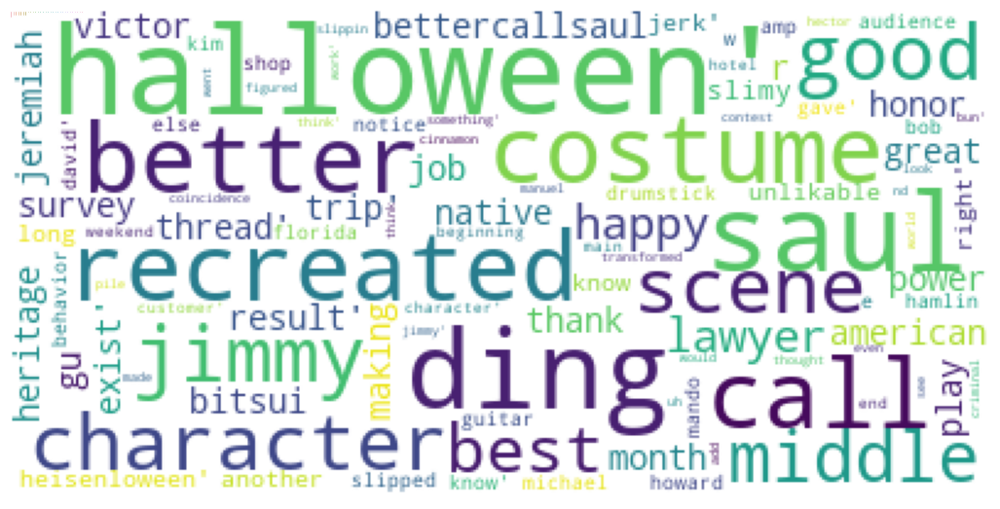

                        Tri-gram  Freq
0                    better call     3
1                      call saul     3
2               better call saul     3
3                      ding ding     2
4                happy halloween     2
5                    saul thread     1
6               call saul thread     1
7        better call saul thread     1
8          bettercallsaul survey     1
9                  survey result     1
10  bettercallsaul survey result     1
11                      gu power     1
12                    power trip     1
13                 gu power trip     1
14                    saul jimmy     1
15                   jimmy exist     1
16               call saul jimmy     1
17              saul jimmy exist     1
18        better call saul jimmy     1
19         call saul jimmy exist     1
20                  honor native     1
21               native american     1
22             american heritage     1
23                heritage month     1
24                   mont

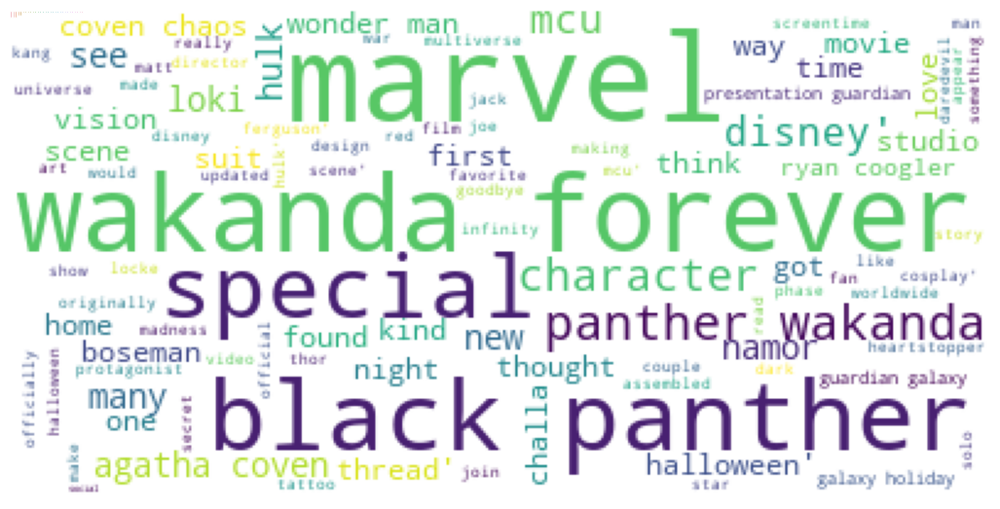

                                Tri-gram  Freq
0                        wakanda forever    12
1                          black panther    10
2                        panther wakanda     8
3                  black panther wakanda     8
4                panther wakanda forever     8
5          black panther wakanda forever     8
6                           agatha coven     4
7                            coven chaos     4
8                     agatha coven chaos     4
9                        holiday special     4
10                         marvel studio     3
11                            wonder man     3
12                          ryan coogler     3
13                  special presentation     3
14                 presentation guardian     3
15                       guardian galaxy     3
16                        galaxy holiday     3
17         special presentation guardian     3
18          presentation guardian galaxy     3
19               guardian galaxy holiday     3
20           

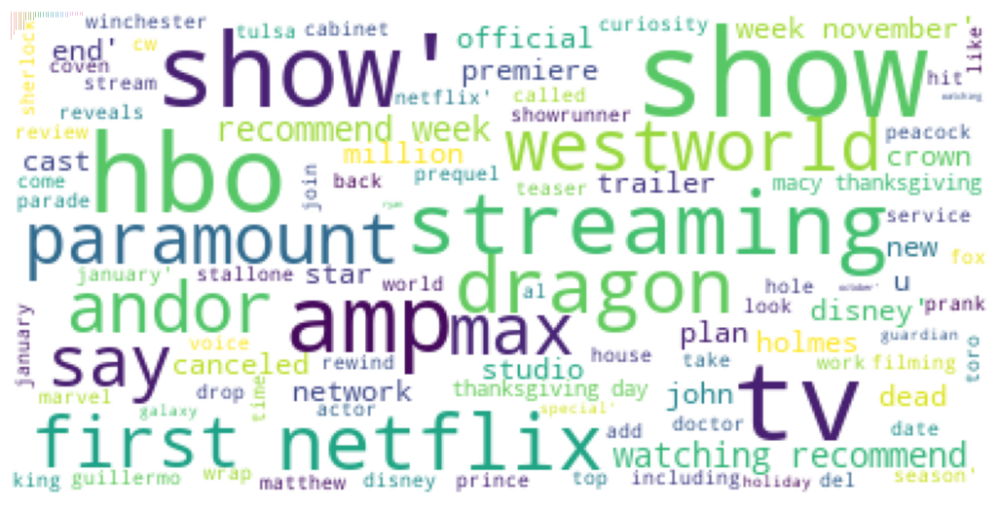

                            Tri-gram  Freq
0                 watching recommend     4
1                     recommend week     4
2            watching recommend week     4
3                            hbo max     4
4                            tv show     4
5                      week november     3
6            recommend week november     3
7   watching recommend week november     3
8                  macy thanksgiving     3
9                   thanksgiving day     3
10                        day parade     3
11             macy thanksgiving day     3
12           thanksgiving day parade     3
13      macy thanksgiving day parade     3
14                       coven chaos     2
15                  official trailer     2
16                      house dragon     2
17                     guillermo del     2
18                          del toro     2
19                      toro cabinet     2
20                 cabinet curiosity     2
21                guillermo del toro     2
22         

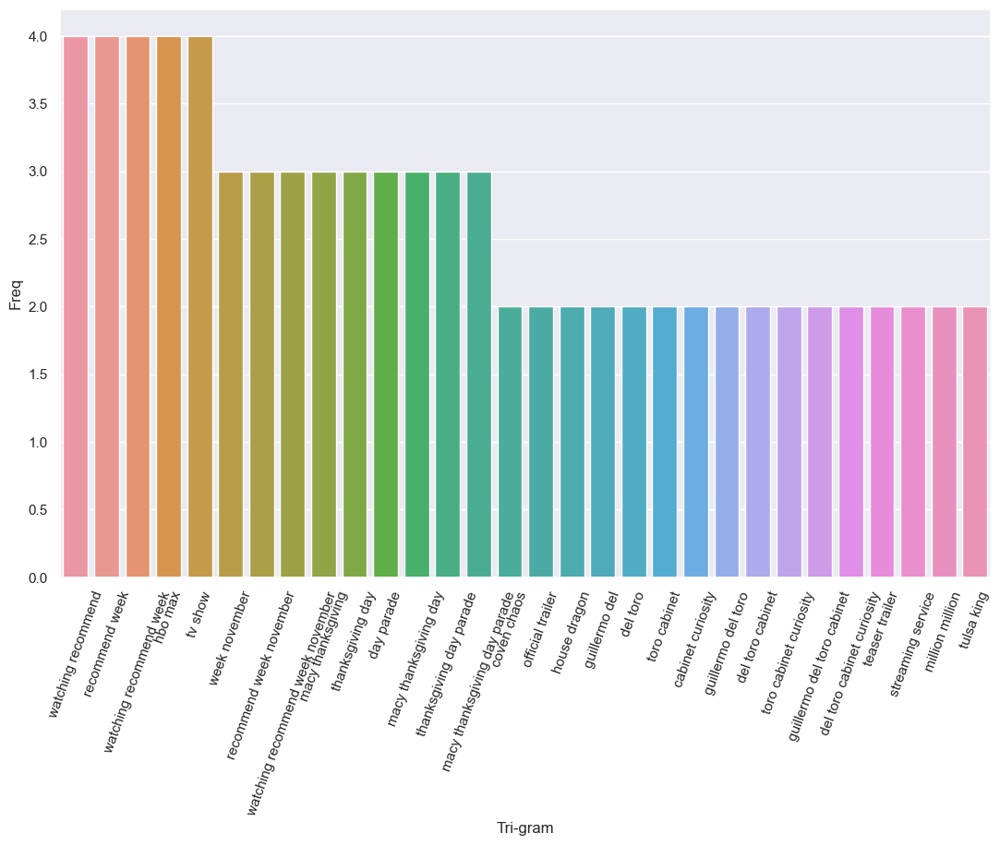

In [22]:
subreddit_list1=["StrangerThings",'HouseOfCards','DunderMifflin','BigBrother','howyoudoin','riverdale','Letterkenny','blackmirror','30ROCK','brooklynninenine','Sherlock','HIMYM', 'thewalkingdead','breakingbad','gameofthrones','TVDetails','betterCallSaul','marvelstudios','television']
#subreddit_list1=['StrangerThings']
from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import re

#Most frequently occuring Tri-grams
def xyz(corpus):

    from sklearn.feature_extraction.text import CountVectorizer
    import seaborn as sns
    import re
    def get_top_n3_words(corpus, n=None):
        vec1 = CountVectorizer(ngram_range=(2,4), 
               max_features=2000).fit(corpus)
        bag_of_words = vec1.transform(corpus)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) for word, idx in     
                      vec1.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], 
                    reverse=True)
        return words_freq[:n]
    top3_words = get_top_n3_words(corpus, n=30)
    top3_df = pd.DataFrame(top3_words)
    top3_df.columns=["Tri-gram", "Freq"]
    print(top3_df)

    #Barplot of most freq Tri-grams
    import seaborn as sns
    sns.set(rc={'figure.figsize':(13,8)})
    j=sns.barplot(x="Tri-gram", y="Freq", data=top3_df)
    j.set_xticklabels(j.get_xticklabels(), rotation=70)
    
for each_sub in subreddit_list1:
    sub_dataframe=df.loc[df['subreddit']==each_sub]
    sub_dataframe.head()
    sub_dataList= sub_dataframe.title.values.tolist()
    corpus = []
    for text in sub_dataList:
        #Remove punctuations
        text = re.sub('[^a-zA-Z]', ' ', text)
        #Convert to lowercase
        text = text.lower()

        #remove tags
        text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)

        # remove special characters and digits
        text=re.sub("(\\d|\\W)+"," ",text)

        ##Convert to list from string
        text = text.split()

        ##Stemming
        ps=PorterStemmer()
        #Lemmatisation
        lem = WordNetLemmatizer()
        text = [lem.lemmatize(word) for word in text if not word in  
                stop_words] 
        text = " ".join(text)
        corpus.append(text)
    print("******For Subreddit ",each_sub,"*******8")
    wordcloud(corpus)
    xyz(corpus)
#     top2_words = get_top_n2_words(corpus, n=20)
#     top2_df = pd.DataFrame(top2_words)
#     top2_df.columns=["Bi-gram", "Freq"]
#     print(top2_df)
#     sns.set(rc={'figure.figsize':(13,8)})
#     h=sns.barplot(x="N-gram", y="Freq", data=top2_df)
#     h.set_xticklabels(h.get_xticklabels(), rotation=45)
    
    print("###########################################################################################################3")
        

In [2]:
db=client['SMDP']

In [3]:
db.reddit.count_documents({})

1218

## Extracting all the commonly used phrase from each subreddit and their count

In [8]:
col = db["reddit"]
 
x = col.find_one()
 
print(x)

cursor = db["reddit"].find()

de =  pd.DataFrame(list(cursor))

{'_id': ObjectId('6361b07a11d8208044573dd6'), 'kind': 't3', 'id': 'yfqh0q', 'subreddit_id': 't5_2qh6e', 'subreddit': 'television', 'text': "Comments are sorted by new by default.\n\n* Feel free to describe what shows you've been watching and what you think of them.\n\n* Feel free to ask for and give recommendations for what to watch to other users.\n\n* All requests for recommendations are redirected to this thread, however you are free to create your own thread to recommend something to others or to discuss what you're currently watching.\n\n* Use spoiler tags where appropriate. Copy and edit this text: \\&gt;!Spoiler!&lt; becomes &gt;!Spoiler!&lt;. Type *inside* the exclamation marks, with no extra spaces.", 'author_fullname': 't2_6l4z3', 'title': 'What are you watching and what do you recommend? (Week of October 28, 2022)', 'subreddit_name_prefixed': 'r/television', 'upvote_ratio': 0.89, 'domain': 'self.television', 'created_date': datetime.datetime(2022, 11, 1, 23, 49, 14, 324000)}

### Creating data frame from reddit collection in database

In [13]:
col = db["reddit"]
 
x = col.find_one()
 
print(x)

cursor = db["reddit"].find()

de =  pd.DataFrame(list(cursor))

{'_id': ObjectId('6361b07a11d8208044573dd6'), 'kind': 't3', 'id': 'yfqh0q', 'subreddit_id': 't5_2qh6e', 'subreddit': 'television', 'text': "Comments are sorted by new by default.\n\n* Feel free to describe what shows you've been watching and what you think of them.\n\n* Feel free to ask for and give recommendations for what to watch to other users.\n\n* All requests for recommendations are redirected to this thread, however you are free to create your own thread to recommend something to others or to discuss what you're currently watching.\n\n* Use spoiler tags where appropriate. Copy and edit this text: \\&gt;!Spoiler!&lt; becomes &gt;!Spoiler!&lt;. Type *inside* the exclamation marks, with no extra spaces.", 'author_fullname': 't2_6l4z3', 'title': 'What are you watching and what do you recommend? (Week of October 28, 2022)', 'subreddit_name_prefixed': 'r/television', 'upvote_ratio': 0.89, 'domain': 'self.television', 'created_date': datetime.datetime(2022, 11, 1, 23, 49, 14, 324000)}

In [14]:
x = col.find({},{'subreddit': 1})

### Printing Data Frame

In [15]:
de

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
0,6361b07a11d8208044573dd6,t3,yfqh0q,t5_2qh6e,television,Comments are sorted by new by default.\n\n* Fe...,t2_6l4z3,What are you watching and what do you recommen...,r/television,0.89,self.television,2022-11-01 23:49:14.324
1,6361b07a11d8208044573dd7,t3,yjdk99,t5_2qh6e,television,,t2_aldnblqh,Ryan Murphy Reveals That Some Fox Execs Called...,r/television,0.89,pride.com,2022-11-01 23:49:14.324
2,6361b07a11d8208044573dd8,t3,yj6q8q,t5_2qh6e,television,,t2_cw2ly,James Corden repeats a joke originally made by...,r/television,0.88,youtu.be,2022-11-01 23:49:14.324
3,6361b07a11d8208044573dd9,t3,yj6paw,t5_2qh6e,television,,t2_5adwlxvn,‘The Last of Us’ HBO Series Release Date Revea...,r/television,0.96,bloody-disgusting.com,2022-11-01 23:49:14.324
4,6361b07a11d8208044573dda,t3,yjbday,t5_2qh6e,television,,t2_5adwlxvn,‘Fate: The Winx Saga’ Cancelled at Netflix Aft...,r/television,0.94,tvline.com,2022-11-01 23:49:14.324
...,...,...,...,...,...,...,...,...,...,...,...,...
1213,63849bc5b3f5bca534a6e695,t3,z6ciav,t5_2rgm3,30ROCK,,t2_dudzq,What favorite little details have you caught? ...,r/30ROCK,0.98,youtu.be,2022-11-28 11:30:13.245
1214,63849bc5b3f5bca534a6e696,t3,z66g55,t5_2rgm3,30ROCK,30 rock is one of my favs but haven’t watched ...,t2_7wq53q0r,It’s shocking how straight laced the first sea...,r/30ROCK,0.96,self.30ROCK,2022-11-28 11:30:13.245
1215,63849bc5b3f5bca534a6e697,t3,z6lopi,t5_2rgm3,30ROCK,,t2_615nw,"Dude, that’s Margaret Cho!",r/30ROCK,1.00,youtu.be,2022-11-28 11:30:13.245
1216,6384d5d9b3f5bca534a6e944,t3,z6u0ka,t5_2cneq,politics,,t2_br3zk9t1,FBI and DHS failing to address threat of domes...,r/politics,0.98,salon.com,2022-11-28 15:38:01.062


In [16]:

de.describe(include='all')

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
count,1218,1218,1218,1218,1218,1218,1216,1218,1218,1218.000000,1218,1218
unique,1218,1,1218,20,20,300,962,1215,20,NaN,150,82
top,6361b07a11d8208044573dd6,t3,yfqh0q,t5_2cneq,politics,,t2_5adwlxvn,Relatable,r/politics,NaN,i.redd.it,2022-11-15 14:06:41.378000
freq,1,1218,1,236,236,914,27,2,236,NaN,390,27
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-11-01 23:49:14.324000
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-11-28 18:38:01.167000
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.915164,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.100934,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.200000,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.890000,NaN,NaN


In [17]:
de.describe()

,upvote_ratio
count,1218.000000
mean,0.915164
std,0.100934
min,0.200000
25%,0.890000
50%,0.950000
75%,0.980000
max,1.000000


### Creating Separate frame for Politics Subreddit

In [18]:
len(de[de[de['subreddit']=='politics']!=None])

1218

In [19]:
de[de['subreddit']=='politics']

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
726,636afd21a7989f77f430dbd5,t3,yq1ezx,t5_2cneq,politics,**For a curated feed of the latest news about ...,t2_onl9u,Discussion Thread: 2022 Midterm General Electi...,r/politics,0.96,self.politics,2022-11-09 01:06:41.449
727,636afd21a7989f77f430dbd6,t3,ypsbya,t5_2cneq,politics,,t2_onl9u,r/Politics 2022 Midterm Live Thread,r/politics,0.96,reddit.com,2022-11-09 01:06:41.449
728,636afd21a7989f77f430dbd7,t3,ypzkoj,t5_2cneq,politics,,t2_tka7jhr,Poll worker seen wearing MAGA hat at poll stat...,r/politics,0.92,abc57.com,2022-11-09 01:06:41.449
729,636afd21a7989f77f430dbd8,t3,yq09ly,t5_2cneq,politics,,t2_epj8ima0,Trump Threatens to Reveal Unflattering Informa...,r/politics,0.97,nytimes.com,2022-11-09 01:06:41.449
730,636afd21a7989f77f430dbd9,t3,yq1ejf,t5_2cneq,politics,,t2_br3zk9t1,Alexandria Ocasio-Cortez says Tucker Carlson f...,r/politics,0.97,businessinsider.com,2022-11-09 01:06:41.449
...,...,...,...,...,...,...,...,...,...,...,...,...
1178,63842d19b3f5bca534a6e3eb,t3,z65mh9,t5_2cneq,politics,,t2_ucolw,"Ga. Senate runoff between Warnock, Walker has ...",r/politics,0.96,apnews.com,2022-11-28 03:38:01.048
1179,63842d19b3f5bca534a6e3ec,t3,z5zpui,t5_2cneq,politics,,t2_bf38q9nm,"After Mueller, legal experts hope for a more v...",r/politics,0.98,thehill.com,2022-11-28 03:38:01.048
1180,63842d19b3f5bca534a6e3ed,t3,z67bls,t5_2cneq,politics,,t2_mqvoy,Poor situational awareness? Herschel Walker di...,r/politics,0.96,savannahnow.com,2022-11-28 03:38:01.048
1216,6384d5d9b3f5bca534a6e944,t3,z6u0ka,t5_2cneq,politics,,t2_br3zk9t1,FBI and DHS failing to address threat of domes...,r/politics,0.98,salon.com,2022-11-28 15:38:01.062


### Number of comments from each subreddit

In [20]:
#number_of_comments
df_number_of_comment=de[de['text']!='']['subreddit'].value_counts().to_frame('number_of_comments')
df_number_of_comment

,number_of_comments
BigBrother,50
thewalkingdead,34
HouseOfCards,23
brooklynninenine,22
television,21
riverdale,20
HIMYM,19
politics,18
marvelstudios,17
blackmirror,14


In [21]:


dftext=de[de['subreddit']=='television']
print(dftext)

                          _id kind      id subreddit_id   subreddit  \
0    6361b07a11d8208044573dd6   t3  yfqh0q     t5_2qh6e  television   
1    6361b07a11d8208044573dd7   t3  yjdk99     t5_2qh6e  television   
2    6361b07a11d8208044573dd8   t3  yj6q8q     t5_2qh6e  television   
3    6361b07a11d8208044573dd9   t3  yj6paw     t5_2qh6e  television   
4    6361b07a11d8208044573dda   t3  yjbday     t5_2qh6e  television   
..                        ...  ...     ...          ...         ...   
965  6381f8b9b3f5bca534a6d67b   t3  z46dgb     t5_2qh6e  television   
966  6381f8b9b3f5bca534a6d67c   t3  z45xv5     t5_2qh6e  television   
967  6381f8b9b3f5bca534a6d67d   t3  z4kssa     t5_2qh6e  television   
968  6381f8b9b3f5bca534a6d67e   t3  z46l7c     t5_2qh6e  television   
969  6381f8b9b3f5bca534a6d67f   t3  z4zuo9     t5_2qh6e  television   

                                                  text author_fullname  \
0    Comments are sorted by new by default.\n\n* Fe...        t2_6l4z3   

In [22]:
len(dftext[dftext['text'] != ''])

21

#### Preprocessing text column and counting null values

In [23]:
len(dftext[dftext['text'] == ''])

83

### Ploting Barplot Between subreddit and no. of posts

In [24]:
df_no_of_post_by_subreddit=de['subreddit'].value_counts().to_frame("no_of_post_by_subreddit").head(10)


          subreddit  no_of_post_by_subreddit
1            30ROCK                      110
2     gameofthrones                      108
3        television                      104
4  brooklynninenine                      101
5     marvelstudios                       94
6    thewalkingdead                       80
7        BigBrother                       63
8         TVDetails                       29
9       breakingbad                       27


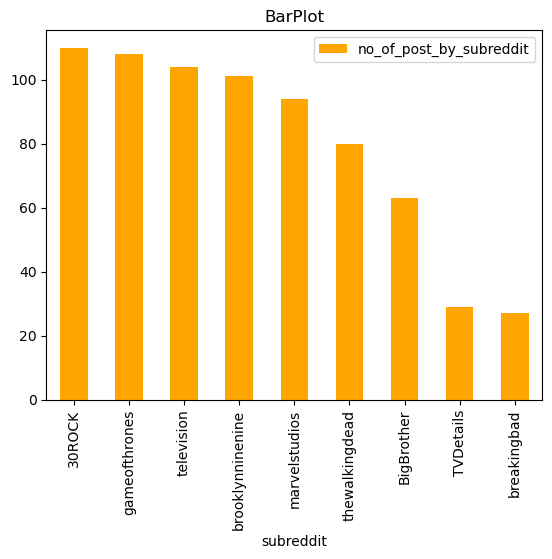

In [25]:
#plot for subreddit vs no_of_post_by_subreddit

import matplotlib.pyplot as plt
import numpy as np


updated_df = pd.DataFrame(df_no_of_post_by_subreddit).reset_index()
updated_df.columns = ['subreddit', 'no_of_post_by_subreddit']


updated_df = updated_df.drop(labels=0, axis=0)
print(updated_df)
updated_df.plot(kind = 'bar',
        x = 'subreddit',
        y = 'no_of_post_by_subreddit',
        color = 'orange')
  
# set the title
plt.title('BarPlot')
  
# show the plot
plt.show()

#df_no_of_post_by_subreddit

### Ploting LInePlot Between subreddit and no. of Comments

          subreddit  number_of_comments
0        BigBrother                  50
1    thewalkingdead                  34
2      HouseOfCards                  23
3  brooklynninenine                  22
4        television                  21


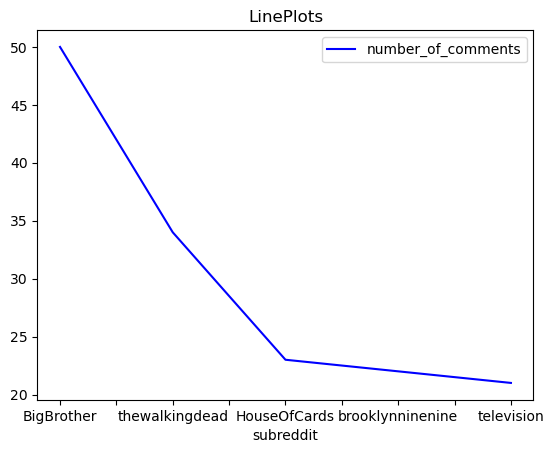

In [26]:
#number of comments for top  subreddit
df_comments=de[de['text']!='']['subreddit'].value_counts().to_frame('number_of_comments').head(5)

updated_df_comments = pd.DataFrame(df_comments).reset_index()
updated_df_comments.columns = ['subreddit', 'number_of_comments']
print(updated_df_comments)
  
# line plot for physics marks
updated_df_comments.plot(kind = 'line',
        x = 'subreddit',
        y = 'number_of_comments',
        color = 'blue')
  
# set the title
plt.title('LinePlots')
  
# show the plot
plt.show()

### Number of comments from top ten Subreddit

In [27]:
#no. of comments for top 10subreddit
de[de['text']!='']['subreddit'].value_counts().to_frame('number_of_comments').head(10)

,number_of_comments
BigBrother,50
thewalkingdead,34
HouseOfCards,23
brooklynninenine,22
television,21
riverdale,20
HIMYM,19
politics,18
marvelstudios,17
blackmirror,14


### Post count by domain

In [28]:
#post count by domain(top10)
de['domain'].value_counts().to_frame("no_of_post_from_domain").head(10)

,no_of_post_from_domain
i.redd.it,390
reddit.com,86
v.redd.it,54
self.BigBrother,48
self.thewalkingdead,31
self.HouseOfCards,25
self.riverdale,23
self.brooklynninenine,23
self.HIMYM,23
i.imgur.com,22


In [29]:
#xy.to_json(r'File Name.json')

In [30]:
userDict={}
for index, row in de.iterrows():
    if row["_id"] in userDict:
        userDict[row["_id"]]+=1
    else:
        userDict[row["_id"]]=1

print(len(userDict))


de['text']!=''

1218


0        True
1       False
2       False
3       False
4       False
        ...  
1213    False
1214     True
1215    False
1216    False
1217     True
Name: text, Length: 1218, dtype: bool

### Top 10 author and their count

In [31]:
# count of author
de['author_fullname'].value_counts().to_frame("author_count").head(10)


,author_count
t2_5adwlxvn,27
t2_onl9u,14
t2_hwpnmhqt,11
t2_ci9x587v,8
t2_5lzl17hr,7
t2_jn0nv,7
t2_cyqdz,6
t2_2xvfkozo,5
t2_6oqiymrl,5
t2_861l0quz,5


In [32]:
de.count()

_id                        1218
kind                       1218
id                         1218
subreddit_id               1218
subreddit                  1218
text                       1218
author_fullname            1216
title                      1218
subreddit_name_prefixed    1218
upvote_ratio               1218
domain                     1218
created_date               1218
dtype: int64

In [33]:
col = db["data_collection_stats"]
 
x = col.find_one()
 
print(x)

cursor = db["data_collection_stats"].find()

ds =  pd.DataFrame(list(cursor))

{'_id': ObjectId('636afd21a7989f77f430dbf0'), 'dataset': 'reddit', 'subreddit': 'politics', 'created_date': datetime.datetime(2022, 11, 9, 0, 0), 'submissions': [{'timestamp': datetime.datetime(2022, 11, 9, 1, 6, 41, 452000), 'count': 27}, {'timestamp': datetime.datetime(2022, 11, 9, 2, 6, 41, 397000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 3, 6, 41, 575000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 4, 6, 41, 408000), 'count': 1}, {'timestamp': datetime.datetime(2022, 11, 9, 5, 6, 41, 410000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 6, 6, 41, 445000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 7, 6, 41, 405000), 'count': 1}, {'timestamp': datetime.datetime(2022, 11, 9, 8, 6, 41, 459000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 9, 6, 41, 425000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 10, 6, 41, 386000), 'count': 0}, {'timestamp': datetime.datetime(2022, 11, 9, 11, 6, 41, 566000), '

In [34]:
ds

,_id,dataset,subreddit,created_date,submissions
0,636afd21a7989f77f430dbf0,reddit,politics,2022-11-09,"[{'timestamp': 2022-11-09 01:06:41.452000, 'co..."
1,636c4091a7989f77f430e192,reddit,politics,2022-11-10,"[{'timestamp': 2022-11-10 00:06:41.375000, 'co..."
2,636d9211a7989f77f430e6d3,reddit,politics,2022-11-11,"[{'timestamp': 2022-11-11 00:06:41.442000, 'co..."
3,636ee391a7989f77f430ed72,reddit,politics,2022-11-12,"[{'timestamp': 2022-11-12 00:06:41.366000, 'co..."
4,63703511a7989f77f430f37a,reddit,politics,2022-11-13,"[{'timestamp': 2022-11-13 00:06:41.412000, 'co..."
5,63718691a7989f77f430f8ee,reddit,politics,2022-11-14,"[{'timestamp': 2022-11-14 00:06:41.355000, 'co..."
6,6372d811a7989f77f430feb2,reddit,politics,2022-11-15,"[{'timestamp': 2022-11-15 00:06:41.332000, 'co..."
7,63742991a7989f77f4310441,reddit,politics,2022-11-16,"[{'timestamp': 2022-11-16 00:06:41.348000, 'co..."
8,63757b11a7989f77f4310933,reddit,politics,2022-11-17,"[{'timestamp': 2022-11-17 00:06:41.691000, 'co..."
9,63810b89b3f5bca534a6d4c4,reddit,politics,2022-11-25,"[{'timestamp': 2022-11-25 18:38:01.124000, 'co..."


In [35]:
de

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
0,6361b07a11d8208044573dd6,t3,yfqh0q,t5_2qh6e,television,Comments are sorted by new by default.\n\n* Fe...,t2_6l4z3,What are you watching and what do you recommen...,r/television,0.89,self.television,2022-11-01 23:49:14.324
1,6361b07a11d8208044573dd7,t3,yjdk99,t5_2qh6e,television,,t2_aldnblqh,Ryan Murphy Reveals That Some Fox Execs Called...,r/television,0.89,pride.com,2022-11-01 23:49:14.324
2,6361b07a11d8208044573dd8,t3,yj6q8q,t5_2qh6e,television,,t2_cw2ly,James Corden repeats a joke originally made by...,r/television,0.88,youtu.be,2022-11-01 23:49:14.324
3,6361b07a11d8208044573dd9,t3,yj6paw,t5_2qh6e,television,,t2_5adwlxvn,‘The Last of Us’ HBO Series Release Date Revea...,r/television,0.96,bloody-disgusting.com,2022-11-01 23:49:14.324
4,6361b07a11d8208044573dda,t3,yjbday,t5_2qh6e,television,,t2_5adwlxvn,‘Fate: The Winx Saga’ Cancelled at Netflix Aft...,r/television,0.94,tvline.com,2022-11-01 23:49:14.324
...,...,...,...,...,...,...,...,...,...,...,...,...
1213,63849bc5b3f5bca534a6e695,t3,z6ciav,t5_2rgm3,30ROCK,,t2_dudzq,What favorite little details have you caught? ...,r/30ROCK,0.98,youtu.be,2022-11-28 11:30:13.245
1214,63849bc5b3f5bca534a6e696,t3,z66g55,t5_2rgm3,30ROCK,30 rock is one of my favs but haven’t watched ...,t2_7wq53q0r,It’s shocking how straight laced the first sea...,r/30ROCK,0.96,self.30ROCK,2022-11-28 11:30:13.245
1215,63849bc5b3f5bca534a6e697,t3,z6lopi,t5_2rgm3,30ROCK,,t2_615nw,"Dude, that’s Margaret Cho!",r/30ROCK,1.00,youtu.be,2022-11-28 11:30:13.245
1216,6384d5d9b3f5bca534a6e944,t3,z6u0ka,t5_2cneq,politics,,t2_br3zk9t1,FBI and DHS failing to address threat of domes...,r/politics,0.98,salon.com,2022-11-28 15:38:01.062


In [36]:
ds

,_id,dataset,subreddit,created_date,submissions
0,636afd21a7989f77f430dbf0,reddit,politics,2022-11-09,"[{'timestamp': 2022-11-09 01:06:41.452000, 'co..."
1,636c4091a7989f77f430e192,reddit,politics,2022-11-10,"[{'timestamp': 2022-11-10 00:06:41.375000, 'co..."
2,636d9211a7989f77f430e6d3,reddit,politics,2022-11-11,"[{'timestamp': 2022-11-11 00:06:41.442000, 'co..."
3,636ee391a7989f77f430ed72,reddit,politics,2022-11-12,"[{'timestamp': 2022-11-12 00:06:41.366000, 'co..."
4,63703511a7989f77f430f37a,reddit,politics,2022-11-13,"[{'timestamp': 2022-11-13 00:06:41.412000, 'co..."
5,63718691a7989f77f430f8ee,reddit,politics,2022-11-14,"[{'timestamp': 2022-11-14 00:06:41.355000, 'co..."
6,6372d811a7989f77f430feb2,reddit,politics,2022-11-15,"[{'timestamp': 2022-11-15 00:06:41.332000, 'co..."
7,63742991a7989f77f4310441,reddit,politics,2022-11-16,"[{'timestamp': 2022-11-16 00:06:41.348000, 'co..."
8,63757b11a7989f77f4310933,reddit,politics,2022-11-17,"[{'timestamp': 2022-11-17 00:06:41.691000, 'co..."
9,63810b89b3f5bca534a6d4c4,reddit,politics,2022-11-25,"[{'timestamp': 2022-11-25 18:38:01.124000, 'co..."


In [37]:
de

,_id,kind,id,subreddit_id,subreddit,text,author_fullname,title,subreddit_name_prefixed,upvote_ratio,domain,created_date
0,6361b07a11d8208044573dd6,t3,yfqh0q,t5_2qh6e,television,Comments are sorted by new by default.\n\n* Fe...,t2_6l4z3,What are you watching and what do you recommen...,r/television,0.89,self.television,2022-11-01 23:49:14.324
1,6361b07a11d8208044573dd7,t3,yjdk99,t5_2qh6e,television,,t2_aldnblqh,Ryan Murphy Reveals That Some Fox Execs Called...,r/television,0.89,pride.com,2022-11-01 23:49:14.324
2,6361b07a11d8208044573dd8,t3,yj6q8q,t5_2qh6e,television,,t2_cw2ly,James Corden repeats a joke originally made by...,r/television,0.88,youtu.be,2022-11-01 23:49:14.324
3,6361b07a11d8208044573dd9,t3,yj6paw,t5_2qh6e,television,,t2_5adwlxvn,‘The Last of Us’ HBO Series Release Date Revea...,r/television,0.96,bloody-disgusting.com,2022-11-01 23:49:14.324
4,6361b07a11d8208044573dda,t3,yjbday,t5_2qh6e,television,,t2_5adwlxvn,‘Fate: The Winx Saga’ Cancelled at Netflix Aft...,r/television,0.94,tvline.com,2022-11-01 23:49:14.324
...,...,...,...,...,...,...,...,...,...,...,...,...
1213,63849bc5b3f5bca534a6e695,t3,z6ciav,t5_2rgm3,30ROCK,,t2_dudzq,What favorite little details have you caught? ...,r/30ROCK,0.98,youtu.be,2022-11-28 11:30:13.245
1214,63849bc5b3f5bca534a6e696,t3,z66g55,t5_2rgm3,30ROCK,30 rock is one of my favs but haven’t watched ...,t2_7wq53q0r,It’s shocking how straight laced the first sea...,r/30ROCK,0.96,self.30ROCK,2022-11-28 11:30:13.245
1215,63849bc5b3f5bca534a6e697,t3,z6lopi,t5_2rgm3,30ROCK,,t2_615nw,"Dude, that’s Margaret Cho!",r/30ROCK,1.00,youtu.be,2022-11-28 11:30:13.245
1216,6384d5d9b3f5bca534a6e944,t3,z6u0ka,t5_2cneq,politics,,t2_br3zk9t1,FBI and DHS failing to address threat of domes...,r/politics,0.98,salon.com,2022-11-28 15:38:01.062


### Preprocessing column for ploting Time-series

In [38]:
da = de.groupby(['created_date',])['text'].count().to_frame()
da

,text
created_date,
2022-11-01 23:49:14.324,26
2022-11-01 23:49:14.940,27
2022-11-01 23:49:15.540,27
2022-11-01 23:49:16.210,25
2022-11-01 23:49:16.783,25
...,...
2022-11-28 11:30:09.626,6
2022-11-28 11:30:10.135,6
2022-11-28 11:30:13.245,7


### Inserting number of comments in array

In [49]:
import datetime as dt

x = de[de["subreddit"].str.contains("politics")== True]
max_temp =x.groupby(x['created_date'].dt.strftime('%Y-%m-%d'))['subreddit'].count().to_frame()
count = []
for index, row in max_temp.iterrows():
    print(row['subreddit'])
    count.append(row['subreddit'])

count = count[:-1]

length_ofarray=len(count)


30
26
27
27
1
26
27
1
1
26
17
27


### ploting time-series for politics subreddit

Text(0, 0.5, 'Comments')

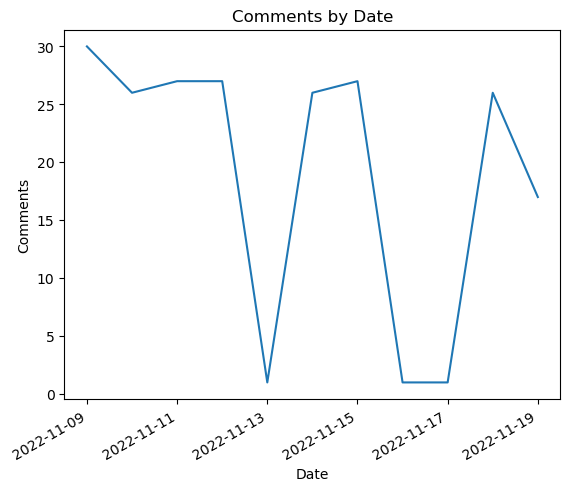

In [50]:
#plot of no_comment per day
import matplotlib.pyplot as plt
import datetime
import numpy as np


 

abc = pd.DataFrame({'date': np.array([datetime.datetime(2022, 11, i+9)
                                              for i in range(length_ofarray)]),
                    'no_of_comments': count})
 
 

plt.plot(abc.date, abc.no_of_comments)
 

 
# Giving title to the graph
plt.title('Comments by Date')
 
# rotating the x-axis tick labels at 30degree
# towards right
plt.xticks(rotation=30, ha='right')
 
# Giving x and y label to the graph
plt.xlabel('Date')
plt.ylabel('Comments')

In [41]:
#da.groupby(['created_date']).groups.keys().to_frame()

In [42]:
df_politics = de.query('subreddit == "politics"')
print(df_politics)

                           _id kind      id subreddit_id subreddit  \
726   636afd21a7989f77f430dbd5   t3  yq1ezx     t5_2cneq  politics   
727   636afd21a7989f77f430dbd6   t3  ypsbya     t5_2cneq  politics   
728   636afd21a7989f77f430dbd7   t3  ypzkoj     t5_2cneq  politics   
729   636afd21a7989f77f430dbd8   t3  yq09ly     t5_2cneq  politics   
730   636afd21a7989f77f430dbd9   t3  yq1ejf     t5_2cneq  politics   
...                        ...  ...     ...          ...       ...   
1178  63842d19b3f5bca534a6e3eb   t3  z65mh9     t5_2cneq  politics   
1179  63842d19b3f5bca534a6e3ec   t3  z5zpui     t5_2cneq  politics   
1180  63842d19b3f5bca534a6e3ed   t3  z67bls     t5_2cneq  politics   
1216  6384d5d9b3f5bca534a6e944   t3  z6u0ka     t5_2cneq  politics   
1217  63850009b3f5bca534a6e98f   t3  z735bb     t5_2cneq  politics   

                                                   text author_fullname  \
726   **For a curated feed of the latest news about ...        t2_onl9u   
727      

In [43]:
de.groupby('created_date', as_index=False).agg({"text": "sum"})

,created_date,text
0,2022-11-01 23:49:14.324,Comments are sorted by new by default.\n\n* Fe...
1,2022-11-01 23:49:14.940,[Brian Davids (The Hollywood Reporter)](https:...
2,2022-11-01 23:49:15.540,"[Well, that's Saul folks.](https://i.imgur.com..."
3,2022-11-01 23:49:16.210,
4,2022-11-01 23:49:16.783,I am currently watching 5x10 and i just don’t ...
...,...,...
77,2022-11-28 11:30:09.626,Previously stated BB24 was the first season I’...
78,2022-11-28 11:30:10.135,I lowkey wished they showed a little bit of wh...
79,2022-11-28 11:30:13.245,"Listen up fives, a ten is speaking. \n\nI just..."
80,2022-11-28 15:38:01.062,


In [44]:
#de.groupby(['created_date']).groups.keys()

In [45]:
#df2 = de.DataFrame().assign(created_date=de['created_date'], text=de['text'])

### Preprocessing and ploting cdf for all subreddits

In [46]:
list_of_comments=df_number_of_comment["number_of_comments"].tolist()
df_number_of_comment

,number_of_comments
BigBrother,50
thewalkingdead,34
HouseOfCards,23
brooklynninenine,22
television,21
riverdale,20
HIMYM,19
politics,18
marvelstudios,17
blackmirror,14


[50, 34, 23, 22, 21, 20, 19, 18, 17, 14, 12, 12, 12, 10, 5, 4, 4, 4, 2, 1]


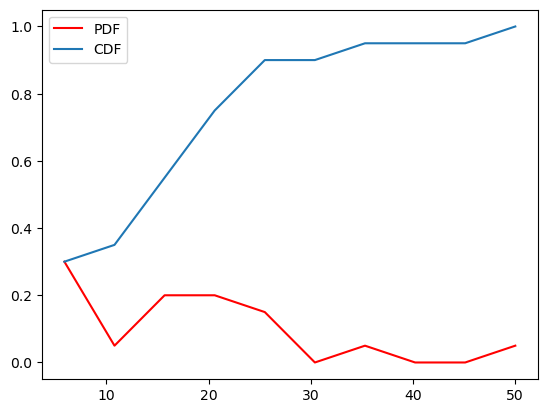

In [47]:

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
  

N = len(list_of_comments)
  

data = list_of_comments 
print(data)  
# getting data of the histogram
count, bins_count = np.histogram(data)
  

pdf = count / sum(count)
  

cdf = np.cumsum(pdf)
  
# plotting PDF and CDF
plt.plot(bins_count[1:], pdf, color="red", label="PDF")
plt.plot(bins_count[1:], cdf, label="CDF")
plt.legend()